<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Notebook-to-run-Walk-Forward-Optimization-with-'memory'-starting-at-different-years" data-toc-modified-id="Notebook-to-run-Walk-Forward-Optimization-with-'memory'-starting-at-different-years-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Notebook to run Walk Forward Optimization with 'memory' starting at different years</a></span><ul class="toc-item"><li><ul class="toc-item"><li><span><a href="#Imports" data-toc-modified-id="Imports-1.0.1"><span class="toc-item-num">1.0.1&nbsp;&nbsp;</span>Imports</a></span></li><li><span><a href="#Data" data-toc-modified-id="Data-1.0.2"><span class="toc-item-num">1.0.2&nbsp;&nbsp;</span>Data</a></span></li></ul></li><li><span><a href="#WF-optimization-with-memory-size-=-10.-1970:2020" data-toc-modified-id="WF-optimization-with-memory-size-=-10.-1970:2020-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>WF optimization with memory size = 10. 1970:2020</a></span><ul class="toc-item"><li><span><a href="#See-OOS-performance" data-toc-modified-id="See-OOS-performance-1.1.1"><span class="toc-item-num">1.1.1&nbsp;&nbsp;</span>See OOS performance</a></span></li><li><span><a href="#Heatmaps-with-widgets" data-toc-modified-id="Heatmaps-with-widgets-1.1.2"><span class="toc-item-num">1.1.2&nbsp;&nbsp;</span>Heatmaps with widgets</a></span></li></ul></li><li><span><a href="#WF-optimization-with-memory-size-=-5.-1970:2020" data-toc-modified-id="WF-optimization-with-memory-size-=-5.-1970:2020-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>WF optimization with memory size = 5. 1970:2020</a></span><ul class="toc-item"><li><span><a href="#See-OOS-performance" data-toc-modified-id="See-OOS-performance-1.2.1"><span class="toc-item-num">1.2.1&nbsp;&nbsp;</span>See OOS performance</a></span></li></ul></li><li><span><a href="#WF-optimization-with-memory-size-=-3.-1970:2020" data-toc-modified-id="WF-optimization-with-memory-size-=-3.-1970:2020-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>WF optimization with memory size = 3. 1970:2020</a></span><ul class="toc-item"><li><span><a href="#See-OOS-performance" data-toc-modified-id="See-OOS-performance-1.3.1"><span class="toc-item-num">1.3.1&nbsp;&nbsp;</span>See OOS performance</a></span></li></ul></li><li><span><a href="#WF-optimization-with-memory-size-=-2.-1970:2020" data-toc-modified-id="WF-optimization-with-memory-size-=-2.-1970:2020-1.4"><span class="toc-item-num">1.4&nbsp;&nbsp;</span>WF optimization with memory size = 2. 1970:2020</a></span><ul class="toc-item"><li><span><a href="#See-OOS-performance" data-toc-modified-id="See-OOS-performance-1.4.1"><span class="toc-item-num">1.4.1&nbsp;&nbsp;</span>See OOS performance</a></span></li></ul></li><li><span><a href="#WF-optimization-with-memory-size-=-1.-1970:2020" data-toc-modified-id="WF-optimization-with-memory-size-=-1.-1970:2020-1.5"><span class="toc-item-num">1.5&nbsp;&nbsp;</span>WF optimization with memory size = 1. 1970:2020</a></span><ul class="toc-item"><li><span><a href="#See-OOS-performance" data-toc-modified-id="See-OOS-performance-1.5.1"><span class="toc-item-num">1.5.1&nbsp;&nbsp;</span>See OOS performance</a></span></li></ul></li></ul></li><li><span><a href="#Putting-all-together:" data-toc-modified-id="Putting-all-together:-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Putting all together:</a></span><ul class="toc-item"><li><span><a href="#Visualization" data-toc-modified-id="Visualization-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Visualization</a></span><ul class="toc-item"><li><span><a href="#Save-data" data-toc-modified-id="Save-data-2.1.1"><span class="toc-item-num">2.1.1&nbsp;&nbsp;</span>Save data</a></span></li></ul></li></ul></li></ul></div>

# Notebook to run Walk Forward Optimization with 'memory' starting at different years

### Imports

In [1]:
# Settings for notebook visualization
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'
%matplotlib inline
from IPython.core.display import HTML
HTML("""<style>.output_png img {display: block;margin-left: auto;margin-right: auto;text-align: center;vertical-align: middle;} </style>""")

In [2]:
# Necessary imports
import os
import numpy as np
import pandas as pd
import matplotlib as plt
from ipywidgets import widgets
from tqdm.auto import tqdm, trange
print("Libraries imported correctly")

Libraries imported correctly


In [3]:
os.chdir("/Users/Sergio/Documents/Master_QF/Thesis/Code/Algorithmic Strategies")
%run Functions.ipynb

### Data

In [4]:
ini_equity_default = 100
commision_default = 2/130000 + 12.5/130000 #0.000111538462, around 0.011..% of the equity

,Close,Market_daily_ret
Date,,
2020-12-24,3703.060059,0.003537
2020-12-28,3735.360107,0.008723
2020-12-29,3727.040039,-0.002227
2020-12-30,3732.040039,0.001342
2020-12-31,3756.070068,0.006439


<AxesSubplot:title={'center':'SP500'}, xlabel='Date'>

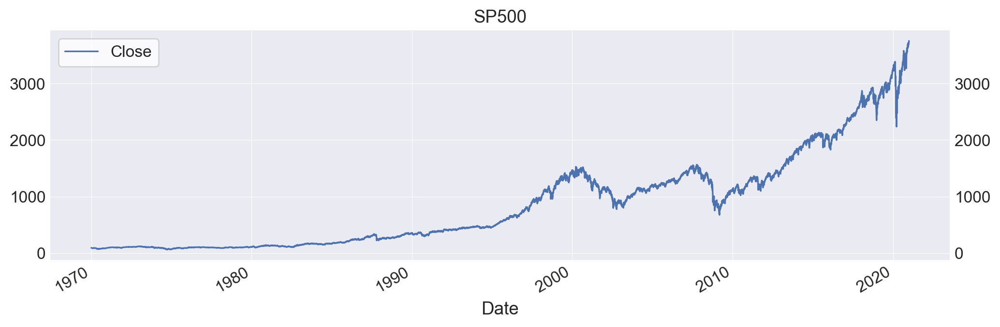

In [5]:
%run Functions.ipynb

#data = get_sp500_data(from_local_file=False, save_to_file=True)
data = get_sp500_data(from_local_file=True, save_to_file=False)
data = data[['Open', 'Close']]

data['Market_daily_ret'] = data['Close'].pct_change().fillna((data['Close']-data['Open'])/data['Open'])
data = data.loc['1970':'2020' ,['Close', 'Market_daily_ret']]

data.tail()
data['Close'].plot(title='SP500', legend=True)

## WF optimization with memory size = 10. 1970:2020

In [6]:
%run Functions.ipynb

memory_len = 9

fast_ma_list = [1, 3, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 500, 500]
slow_ma_list = [5, 10, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 220, 240, 260, 280, 300]

IS_start = pd.date_range(start='1970-01-01', end='2017-01-01', freq='1YS', closed=None)
IS_end = pd.date_range(start='1972-12-31', end='2019-12-31', freq='1Y', closed=None)
OOS_start = pd.date_range(start='1973-01-01', end='2020-01-01', freq='1YS', closed=None)
OOS_end = pd.date_range(start='1973-12-31', end='2020-12-31', freq='1Y', closed=None)

print(f'Number of combinations: {len(fast_ma_list)*len(slow_ma_list)}\n' 
      f'Length of memory (# of IS periods): {memory_len}')
print_periods(IS_start, IS_end, OOS_start, OOS_end)

num_combinations = len(fast_ma_list)*len(slow_ma_list)
num_is_years = round((IS_end[0]-IS_start[0]).days/365, 0)
num_oos_years = round((OOS_end[0]-OOS_start[0]).days/365, 0)
info_wf_str = (f'Running {num_combinations} backtests on \n'
               f'\t{len(IS_start)} IS rolling windows of {num_is_years} years\n'
               f'\t{len(OOS_start)} OOS rolling windows of {num_oos_years} years\n'
               f'->Total of {num_combinations*len(IS_start)+len(OOS_start)*2} backtests'
               f'\tMemory of {memory_len} IS periods\n'
              )
        
num_neighbors_matrix = get_num_neighbors_ma_crossover(fast_ma_list, slow_ma_list)

Number of combinations: 289
Length of memory (# of IS periods): 9
Number of periods: 48 : 48     48 : 48
	In SAMPLE		OOS
1970-01-01 : 1972-12-31 	 1973-01-01 : 1973-12-31
1971-01-01 : 1973-12-31 	 1974-01-01 : 1974-12-31
1972-01-01 : 1974-12-31 	 1975-01-01 : 1975-12-31
... ... ... ... ... ... 	 ... ... ... ... ... ...
2016-01-01 : 2018-12-31 	 2019-01-01 : 2019-12-31
2017-01-01 : 2019-12-31 	 2020-01-01 : 2020-12-31


In [7]:
%run Functions.ipynb
hide = True

df_wf_mem10 = data[IS_start[0]:OOS_end[-1]].copy()
#df_walk_forward = df_walk_forward.loc[:'2020-05-02']

if hide == True:
    # Copy data and create necessary columns 
    new_cols = ['Strat_daily_ret', 'Strat_position_BOD', 'Long_only', 'Costs', 'Market_cum_ret']

    df_wf_mem10= df_wf_mem10.reindex(columns = df_wf_mem10.columns.tolist() + new_cols)

    last_position = 0 # We suppose that we start not being invested. 1:long, -1:short

    indiv_ir_list_mem10 = []
    robust_ir_list_mem10 = []
    market_ir_list_mem10 = []

    weights_list_mem10 = []
    weights_list_mem10.append(np.zeros((len(fast_ma_list),len(slow_ma_list))))

    cummulated_weights_list_mem10 = []

    fast_ma_best_list_mem10 = []
    slow_ma_best_list_mem10 = []

    print(info_wf_str)
    
for i in trange(len(IS_start), desc='Walk Forward loop:'):    
    #print(f'{IS_start[i].year} to {IS_end[i].year}')
    
    is_period = df_wf_mem10.loc[IS_start[i]:IS_end[i]].copy()
    oos_period = df_wf_mem10.loc[OOS_start[i]:OOS_end[i]].copy()
    
    ############################################ IN SAMPLE  ############################################
    strat_pnl_matrix, strats_ir_matrix, market_pnl, market_ir = run_all_combinations_ma_crossover(is_period, fast_ma_list, slow_ma_list, last_position)
    indiv_ir_list_mem10.append(strats_ir_matrix)
    market_ir_list_mem10.append(market_ir)
    
    # Get the best combination the In-Sample period, or buy_and_hold if it performed better
    best, robust_strats_ir_matrix, IS_weights = get_best_combination_with_memory(strats_ir_matrix, 
                                                                                weights_list_mem10, memory_len, 
                                                                                market_ir, num_neighbors_matrix,
                                                                                fast_ma_list, slow_ma_list)
        
    robust_ir_list_mem10.append(robust_strats_ir_matrix)
    weights_list_mem10.append(IS_weights)
    cummulated_weights_list_mem10.append(np.sum(weights_list_mem10[-(memory_len+1):], axis=0))
    
#    print("\tParams: {} {}" .format(best['param1'], best['param2']))
    fast_ma_best_list_mem10.append(best['param1'])
    slow_ma_best_list_mem10.append(best['param2'])
    
    #print("Best In-sample performance: ")
    if hide == True:
#         print_backtest_stats(is_period, strat_pnl_matrix[best['param1_index'], best['param2_index']], 
#                                strats_ir_matrix[best['param1_index'], best['param2_index']], market_pnl, market_ir,
#                              strat_params=(best['param1'], best['param2']))
        hide = True

    ############################################ OUT OF SAMPLE  ############################################
    #print("OOS performance:")
    if hide == True:
        strategy = ma_crossover(oos_period, best['param1'], best['param2'])
        oos_period, last_position, strat_pnl, strat_ir, market_pnl, market_ir = backtest_strat(oos_period, strategy, previous_position=last_position)
#        print_backtest_stats(oos_period, strat_pnl, strat_ir, market_pnl, market_ir, strat_params=(best['param1'], best['param2']))

        # Save come columns from OOS
        df_wf_mem10.loc[OOS_start[i]:OOS_end[i], new_cols] = oos_period[new_cols]
    
# Delete first element from weights_list_mem10 (it was initialized to 0)
weights_list_mem10 = weights_list_mem10[1:]

print("End of Walk Forward Optimization")

Running 289 backtests on 
	48 IS rolling windows of 3.0 years
	48 OOS rolling windows of 1.0 years
->Total of 13968 backtests	Memory of 9 IS periods




End of Walk Forward Optimization


### See OOS performance

Initial invested capital = 100.00


,AbsRet,ARC,IR,aSD,MD,AMD,MLD,IR**,All Risk,ARCMD,ARCAMD,Num Trades,Out of market
MA Crossover with WF memory = 10,3703.9726,7.8671,0.5929,13.2694,49.1469,9.7505,13.0021,0.0949,8.2678,0.1601,0.8068,1123,3330
Buy and Hold,3081.7619,7.4669,0.4270,17.4882,56.7754,14.6840,7.5099,0.0562,10.9493,0.1315,0.5085,1,0


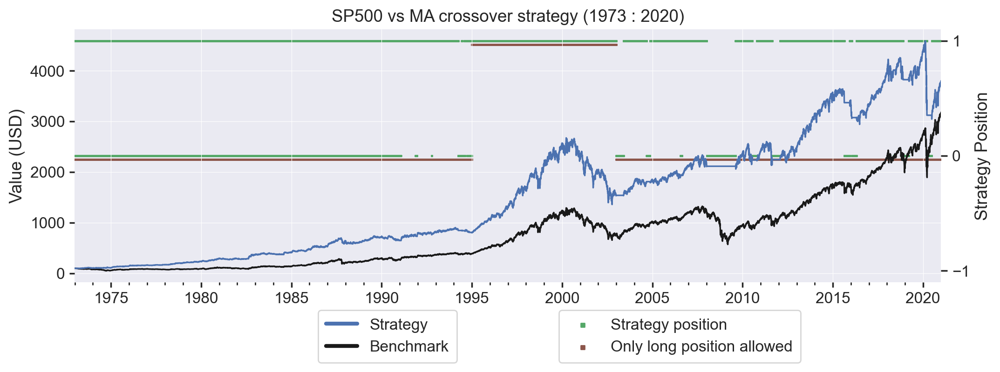

In [8]:
%run Functions.ipynb
#ini_mon = df_wf_mem10[str(OOS_start[0].year-1)].iloc[-1]['Close']
ini_mon = 100
print("Initial invested capital = {:.2f}".format(ini_mon))

results_df_mem10 = prepare_oos_df(df_wf_mem10.loc[OOS_start[0]:OOS_end[-1]].copy(), ini_equity=ini_mon)
#results_df = prepare_oos_df(df_wf_mem10.loc['2000':].copy(), ini_equity=ini_mon)

metrics = calculate_performance_metrics(results_df_mem10, strat_name='MA Crossover with WF memory = 10')
metrics

show_oos_plot(results_df_mem10, with_legend=True)

In [9]:
params_combinations_mem10 = pd.DataFrame([fast_ma_best_list_mem10, slow_ma_best_list_mem10], index=['fast_ma', 'slow_ma'], columns=OOS_start.year)
params_combinations_mem10

,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
fast_ma,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,65,60,55,50,50,50,45,45,50,40,40,35,50,50,50,50,40,45
slow_ma,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,200,260,260,260,0,0,0,0,0,0,0,0,220,220,220,240,260,260,260,260,240,260,260,300,140,140,140,140,140,120


### Heatmaps with widgets

In [10]:
%run Functions.ipynb

options = [year for year in IS_start.year]

selection_slider = widgets.SelectionSlider(
    options=options,
    description='Starting IS year',
    orientation='horizontal',
    layout={'width': '900px'},
)
#selection_slider

def plot_heatmap(year):
    index = year - IS_start.year[0]
    show_both_heatmaps_new(robust_ir_list_mem10[index], weights_list_mem10[index], market_ir_list_mem10[index], 
                           plot_title=f'{year}:{year+2}', left_plot_title="Robust IR", right_plot_title="weights",
                           x_title="Slow MA", x_values=slow_ma_list, y_title="Fast MA", y_values=fast_ma_list)   

widgets.interact(
    plot_heatmap,
    year=selection_slider
);

interactive(children=(SelectionSlider(description='Starting IS year', layout=Layout(width='900px'), options=(1…

In [11]:
%run Functions.ipynb
from ipywidgets import widgets

options = [year for year in IS_start.year]

selection_slider = widgets.SelectionSlider(
    options=options,
    description='Starting IS year',
    orientation='horizontal',
    layout={'width': '900px'},
)
#selection_slider

def plot_heatmap(year):
    index = year - IS_start.year[0]
    #show_both_heatmaps(indiv_ir_list[index], robust_ir_list[index], market_ir_list[index], plot_title=str(year), x_title="Slow MA", x_values=slow_ma_list, y_title="Fast MA", y_values=fast_ma_list)    
    show_both_heatmaps_new(100*weights_list_mem10[index], 100*cummulated_weights_list_mem10[index], market_ir_list_mem10[index], 
                           plot_title=f'{year}:{year+2}', left_plot_title="weights (%)", right_plot_title="Cummulative weights (%)",
                           x_title="Slow MA", x_values=slow_ma_list, y_title="Fast MA", y_values=fast_ma_list)   
    
widgets.interact(
    plot_heatmap,
    year=selection_slider
);

interactive(children=(SelectionSlider(description='Starting IS year', layout=Layout(width='900px'), options=(1…

## WF optimization with memory size = 5. 1970:2020

In [12]:
%run Functions.ipynb

memory_len = 4

In [13]:
%run Functions.ipynb
hide = True

df_wf_mem5 = data[IS_start[0]:OOS_end[-1]].copy()
#df_walk_forward = df_walk_forward.loc[:'2020-05-02']

if hide == True:
    # Copy data and create necessary columns 
    new_cols = ['Strat_daily_ret', 'Strat_position_BOD', 'Long_only', 'Costs', 'Market_cum_ret']

    df_wf_mem5= df_wf_mem5.reindex(columns = df_wf_mem5.columns.tolist() + new_cols)

    last_position = 0 # We suppose that we start not being invested. 1:long, -1:short

    indiv_ir_list_mem5 = []
    robust_ir_list_mem5 = []
    market_ir_list_mem5 = []

    weights_list_mem5 = []
    weights_list_mem5.append(np.zeros((len(fast_ma_list),len(slow_ma_list))))

    cummulated_weights_list_mem5 = []

    fast_ma_best_list_mem5 = []
    slow_ma_best_list_mem5 = []

    print(info_wf_str)
    
for i in trange(len(IS_start), desc='Walk Forward loop:'):    
    #print(f'{IS_start[i].year} to {IS_end[i].year}')
    
    is_period = df_wf_mem5.loc[IS_start[i]:IS_end[i]].copy()
    oos_period = df_wf_mem5.loc[OOS_start[i]:OOS_end[i]].copy()
    
    ############################################ IN SAMPLE  ############################################
    strat_pnl_matrix, strats_ir_matrix, market_pnl, market_ir = run_all_combinations_ma_crossover(is_period, fast_ma_list, slow_ma_list, last_position)
    indiv_ir_list_mem5.append(strats_ir_matrix)
    market_ir_list_mem5.append(market_ir)
    
    # Get the best combination the In-Sample period, or buy_and_hold if it performed better
    best, robust_strats_ir_matrix, IS_weights = get_best_combination_with_memory(strats_ir_matrix, 
                                                                                weights_list_mem5, memory_len, 
                                                                                market_ir, num_neighbors_matrix,
                                                                                fast_ma_list, slow_ma_list)
        
    robust_ir_list_mem5.append(robust_strats_ir_matrix)
    weights_list_mem5.append(IS_weights)
    cummulated_weights_list_mem5.append(np.sum(weights_list_mem5[-(memory_len+1):], axis=0))
    
#    print("\tParams: {} {}" .format(best['param1'], best['param2']))
    fast_ma_best_list_mem5.append(best['param1'])
    slow_ma_best_list_mem5.append(best['param2'])
    
    #print("Best In-sample performance: ")
    if hide == True:
#         print_backtest_stats(is_period, strat_pnl_matrix[best['param1_index'], best['param2_index']], 
#                                strats_ir_matrix[best['param1_index'], best['param2_index']], market_pnl, market_ir,
#                              strat_params=(best['param1'], best['param2']))
        hide = True

    ############################################ OUT OF SAMPLE  ############################################
    #print("OOS performance:")
    if hide == True:
        strategy = ma_crossover(oos_period, best['param1'], best['param2'])
        oos_period, last_position, strat_pnl, strat_ir, market_pnl, market_ir = backtest_strat(oos_period, strategy, previous_position=last_position)
#        print_backtest_stats(oos_period, strat_pnl, strat_ir, market_pnl, market_ir, strat_params=(best['param1'], best['param2']))

        # Save come columns from OOS
        df_wf_mem5.loc[OOS_start[i]:OOS_end[i], new_cols] = oos_period[new_cols]
    
# Delete first element from weights_list_mem5 (it was initialized to 0)
weights_list_mem5 = weights_list_mem5[1:]

print("End of Walk Forward Optimization")

Running 289 backtests on 
	48 IS rolling windows of 3.0 years
	48 OOS rolling windows of 1.0 years
->Total of 13968 backtests	Memory of 9 IS periods




End of Walk Forward Optimization


### See OOS performance

Initial invested capital = 100.00


,AbsRet,ARC,IR,aSD,MD,AMD,MLD,IR**,All Risk,ARCMD,ARCAMD,Num Trades,Out of market
MA Crossover with WF memory = 5,5635.8392,8.7930,0.6891,12.7610,36.7708,9.2189,6.0972,0.1648,2.6375,0.2391,0.9538,893,3417
Buy and Hold,3081.7619,7.4669,0.4270,17.4882,56.7754,14.6840,7.5099,0.0562,10.9493,0.1315,0.5085,1,0


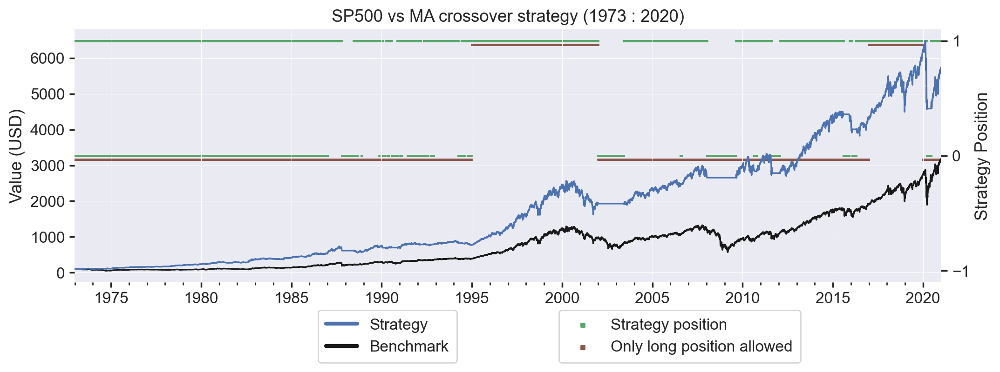

In [14]:
%run Functions.ipynb
ini_mon = 100
print("Initial invested capital = {:.2f}".format(ini_mon))

results_df_mem5 = prepare_oos_df(df_wf_mem5.loc[OOS_start[0]:OOS_end[-1]].copy(), ini_equity=ini_mon)
#results_df = prepare_oos_df(df_wf_mem5.loc['2000':].copy(), ini_equity=ini_mon)

metrics = calculate_performance_metrics(results_df_mem5, strat_name='MA Crossover with WF memory = 5')
metrics

show_oos_plot(results_df_mem5, with_legend=True)

In [15]:
params_combinations_mem5 = pd.DataFrame([fast_ma_best_list_mem5, slow_ma_best_list_mem5], index=['fast_ma', 'slow_ma'], columns=OOS_start.year)
params_combinations_mem5

,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
fast_ma,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,35,35,35,1,5,0,0,0,0,0,0,0,45,45,50,50,50,50,25,35,35,35,35,40,45,45,45,0,0,0,25
slow_ma,5,5,5,5,5,5,5,5,5,5,5,5,5,5,220,220,140,40,40,40,260,300,0,0,0,0,0,0,0,280,280,260,240,240,240,280,280,280,220,220,160,120,120,120,0,0,0,240


## WF optimization with memory size = 3. 1970:2020

In [16]:
%run Functions.ipynb

memory_len = 2

In [17]:
%run Functions.ipynb
hide = True

df_wf_mem3 = data[IS_start[0]:OOS_end[-1]].copy()
#df_walk_forward = df_walk_forward.loc[:'2020-05-02']

if hide == True:
    # Copy data and create necessary columns 
    new_cols = ['Strat_daily_ret', 'Strat_position_BOD', 'Long_only', 'Costs', 'Market_cum_ret']

    df_wf_mem3= df_wf_mem3.reindex(columns = df_wf_mem3.columns.tolist() + new_cols)

    last_position = 0 # We suppose that we start not being invested. 1:long, -1:short

    indiv_ir_list_mem3 = []
    robust_ir_list_mem3 = []
    market_ir_list_mem3 = []

    weights_list_mem3 = []
    weights_list_mem3.append(np.zeros((len(fast_ma_list),len(slow_ma_list))))

    cummulated_weights_list_mem3 = []

    fast_ma_best_list_mem3 = []
    slow_ma_best_list_mem3 = []

    print(info_wf_str)
    
for i in trange(len(IS_start), desc='Walk Forward loop:'):    
    #print(f'{IS_start[i].year} to {IS_end[i].year}')
    
    is_period = df_wf_mem3.loc[IS_start[i]:IS_end[i]].copy()
    oos_period = df_wf_mem3.loc[OOS_start[i]:OOS_end[i]].copy()
    
    ############################################ IN SAMPLE  ############################################
    strat_pnl_matrix, strats_ir_matrix, market_pnl, market_ir = run_all_combinations_ma_crossover(is_period, fast_ma_list, slow_ma_list, last_position)
    indiv_ir_list_mem3.append(strats_ir_matrix)
    market_ir_list_mem3.append(market_ir)
    
    # Get the best combination the In-Sample period, or buy_and_hold if it performed better
    best, robust_strats_ir_matrix, IS_weights = get_best_combination_with_memory(strats_ir_matrix, 
                                                                                weights_list_mem3, memory_len, 
                                                                                market_ir, num_neighbors_matrix,
                                                                                fast_ma_list, slow_ma_list)
        
    robust_ir_list_mem3.append(robust_strats_ir_matrix)
    weights_list_mem3.append(IS_weights)
    cummulated_weights_list_mem3.append(np.sum(weights_list_mem3[-(memory_len+1):], axis=0))
    
#    print("\tParams: {} {}" .format(best['param1'], best['param2']))
    fast_ma_best_list_mem3.append(best['param1'])
    slow_ma_best_list_mem3.append(best['param2'])
    
    #print("Best In-sample performance: ")
    if hide == True:
#         print_backtest_stats(is_period, strat_pnl_matrix[best['param1_index'], best['param2_index']], 
#                                strats_ir_matrix[best['param1_index'], best['param2_index']], market_pnl, market_ir,
#                              strat_params=(best['param1'], best['param2']))
        hide = True

    ############################################ OUT OF SAMPLE  ############################################
    #print("OOS performance:")
    if hide == True:
        strategy = ma_crossover(oos_period, best['param1'], best['param2'])
        oos_period, last_position, strat_pnl, strat_ir, market_pnl, market_ir = backtest_strat(oos_period, strategy, previous_position=last_position)
#        print_backtest_stats(oos_period, strat_pnl, strat_ir, market_pnl, market_ir, strat_params=(best['param1'], best['param2']))

        # Save come columns from OOS
        df_wf_mem3.loc[OOS_start[i]:OOS_end[i], new_cols] = oos_period[new_cols]
    
# Delete first element from weights_list_mem3 (it was initialized to 0)
weights_list_mem3 = weights_list_mem3[1:]

print("End of Walk Forward Optimization")

Running 289 backtests on 
	48 IS rolling windows of 3.0 years
	48 OOS rolling windows of 1.0 years
->Total of 13968 backtests	Memory of 9 IS periods




End of Walk Forward Optimization


### See OOS performance

Initial invested capital = 100.00


,AbsRet,ARC,IR,aSD,MD,AMD,MLD,IR**,All Risk,ARCMD,ARCAMD,Num Trades,Out of market
MA Crossover with WF memory = 3,2863.4169,7.3080,0.5341,13.6839,51.9254,9.6032,9.9220,0.0752,6.7702,0.1407,0.7610,815,3448
Buy and Hold,3081.7619,7.4669,0.4270,17.4882,56.7754,14.6840,7.5099,0.0562,10.9493,0.1315,0.5085,1,0


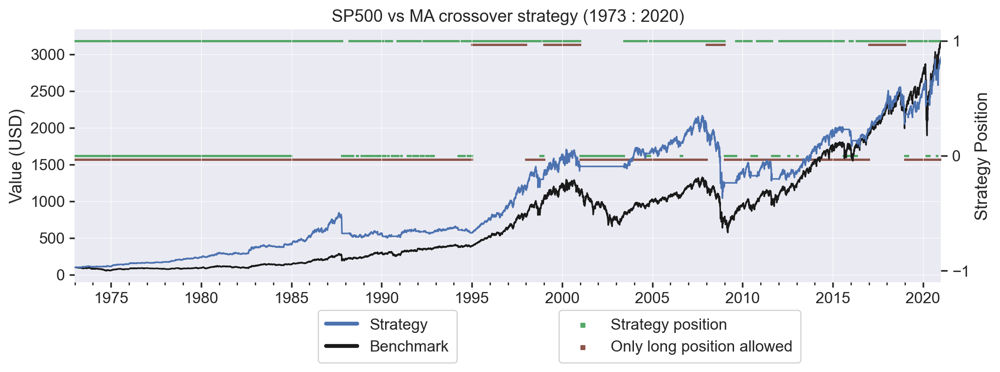

In [18]:
%run Functions.ipynb
#ini_mon = df_wf_mem3[str(OOS_start[0].year-1)].iloc[-1]['Close']
ini_mon = 100
print("Initial invested capital = {:.2f}".format(ini_mon))

results_df_mem3 = prepare_oos_df(df_wf_mem3.loc[OOS_start[0]:OOS_end[-1]].copy(), ini_equity=ini_mon)
#results_df = prepare_oos_df(df_wf_mem3.loc['2000':].copy(), ini_equity=ini_mon)

metrics = calculate_performance_metrics(results_df_mem3, strat_name='MA Crossover with WF memory = 3')
metrics

show_oos_plot(results_df_mem3, with_legend=True)

In [19]:
params_combinations_mem3 = pd.DataFrame([fast_ma_best_list_mem3, slow_ma_best_list_mem3], index=['fast_ma', 'slow_ma'], columns=OOS_start.year)
params_combinations_mem3

,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
fast_ma,1,1,1,1,1,1,1,1,1,1,1,1,1,1,3,1,1,35,35,30,5,5,0,0,0,65,0,0,65,45,45,55,50,50,50,0,35,35,35,40,45,45,45,50,0,0,25,20
slow_ma,5,5,5,5,5,5,5,5,5,5,5,5,220,220,240,140,20,40,40,40,300,300,0,0,0,220,0,0,300,280,280,220,240,240,240,0,280,220,220,160,120,120,120,120,0,0,240,60


## WF optimization with memory size = 2. 1970:2020

In [20]:
%run Functions.ipynb

memory_len = 1

In [21]:
%run Functions.ipynb
hide = True

df_wf_mem2 = data[IS_start[0]:OOS_end[-1]].copy()
#df_walk_forward = df_walk_forward.loc[:'2020-05-02']

if hide == True:
    # Copy data and create necessary columns 
    new_cols = ['Strat_daily_ret', 'Strat_position_BOD', 'Long_only', 'Costs', 'Market_cum_ret']

    df_wf_mem2= df_wf_mem2.reindex(columns = df_wf_mem2.columns.tolist() + new_cols)

    last_position = 0 # We suppose that we start not being invested. 1:long, -1:short

    indiv_ir_list_mem2 = []
    robust_ir_list_mem2 = []
    market_ir_list_mem2 = []

    weights_list_mem2 = []
    weights_list_mem2.append(np.zeros((len(fast_ma_list),len(slow_ma_list))))

    cummulated_weights_list_mem2 = []

    fast_ma_best_list_mem2 = []
    slow_ma_best_list_mem2 = []

    print(info_wf_str)
    
for i in trange(len(IS_start), desc='Walk Forward loop:'):    
    #print(f'{IS_start[i].year} to {IS_end[i].year}')
    
    is_period = df_wf_mem2.loc[IS_start[i]:IS_end[i]].copy()
    oos_period = df_wf_mem2.loc[OOS_start[i]:OOS_end[i]].copy()
    
    ############################################ IN SAMPLE  ############################################
    strat_pnl_matrix, strats_ir_matrix, market_pnl, market_ir = run_all_combinations_ma_crossover(is_period, fast_ma_list, slow_ma_list, last_position)
    indiv_ir_list_mem2.append(strats_ir_matrix)
    market_ir_list_mem2.append(market_ir)
    
    # Get the best combination the In-Sample period, or buy_and_hold if it performed better
    best, robust_strats_ir_matrix, IS_weights = get_best_combination_with_memory(strats_ir_matrix, 
                                                                                weights_list_mem2, memory_len, 
                                                                                market_ir, num_neighbors_matrix,
                                                                                fast_ma_list, slow_ma_list)
        
    robust_ir_list_mem2.append(robust_strats_ir_matrix)
    weights_list_mem2.append(IS_weights)
    cummulated_weights_list_mem2.append(np.sum(weights_list_mem2[-(memory_len+1):], axis=0))
    
#    print("\tParams: {} {}" .format(best['param1'], best['param2']))
    fast_ma_best_list_mem2.append(best['param1'])
    slow_ma_best_list_mem2.append(best['param2'])
    
    #print("Best In-sample performance: ")
    if hide == True:
#         print_backtest_stats(is_period, strat_pnl_matrix[best['param1_index'], best['param2_index']], 
#                                strats_ir_matrix[best['param1_index'], best['param2_index']], market_pnl, market_ir,
#                              strat_params=(best['param1'], best['param2']))
        hide = True

    ############################################ OUT OF SAMPLE  ############################################
    #print("OOS performance:")
    if hide == True:
        strategy = ma_crossover(oos_period, best['param1'], best['param2'])
        oos_period, last_position, strat_pnl, strat_ir, market_pnl, market_ir = backtest_strat(oos_period, strategy, previous_position=last_position)
#        print_backtest_stats(oos_period, strat_pnl, strat_ir, market_pnl, market_ir, strat_params=(best['param1'], best['param2']))

        # Save come columns from OOS
        df_wf_mem2.loc[OOS_start[i]:OOS_end[i], new_cols] = oos_period[new_cols]
    
# Delete first element from weights_list_mem2 (it was initialized to 0)
weights_list_mem2 = weights_list_mem2[1:]

print("End of Walk Forward Optimization")

Running 289 backtests on 
	48 IS rolling windows of 3.0 years
	48 OOS rolling windows of 1.0 years
->Total of 13968 backtests	Memory of 9 IS periods




End of Walk Forward Optimization


### See OOS performance

Initial invested capital = 100.00


,AbsRet,ARC,IR,aSD,MD,AMD,MLD,IR**,All Risk,ARCMD,ARCAMD,Num Trades,Out of market
MA Crossover with WF memory = 2,4057.8346,8.0670,0.6453,12.5005,34.5888,8.8973,7.8905,0.1505,3.0355,0.2332,0.9067,713,3639
Buy and Hold,3081.7619,7.4669,0.4270,17.4882,56.7754,14.6840,7.5099,0.0562,10.9493,0.1315,0.5085,1,0


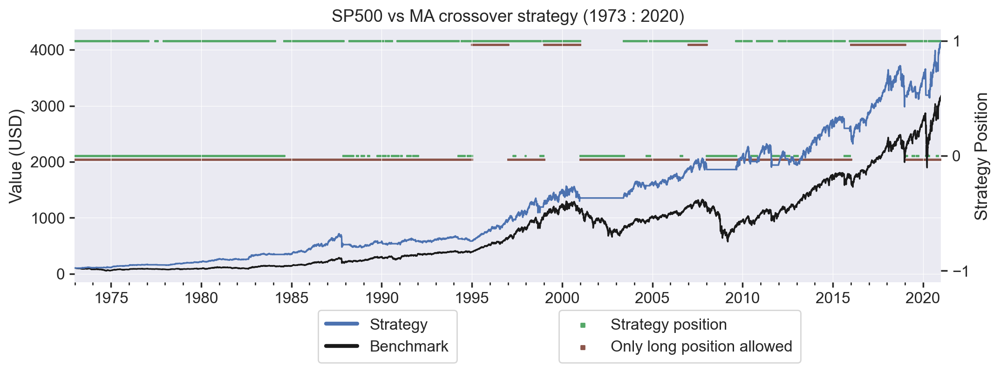

In [22]:
%run Functions.ipynb
ini_mon = 100
print("Initial invested capital = {:.2f}".format(ini_mon))

results_df_mem2 = prepare_oos_df(df_wf_mem2.loc[OOS_start[0]:OOS_end[-1]].copy(), ini_equity=ini_mon)
#results_df = prepare_oos_df(df_wf_mem2.loc['2000':].copy(), ini_equity=ini_mon)

metrics = calculate_performance_metrics(results_df_mem2, strat_name='MA Crossover with WF memory = 2')
metrics

show_oos_plot(results_df_mem2, with_legend=True)

In [23]:
params_combinations_mem2 = pd.DataFrame([fast_ma_best_list_mem2, slow_ma_best_list_mem2], index=['fast_ma', 'slow_ma'], columns=OOS_start.year)
params_combinations_mem2

,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
fast_ma,1,1,1,1,1,1,1,1,1,1,1,1,1,3,65,1,35,35,30,5,5,5,0,0,35,65,0,0,65,45,50,55,50,50,0,40,35,35,35,5,45,45,50,0,0,0,20,25
slow_ma,5,5,5,5,100,5,5,5,5,5,5,220,220,240,180,140,40,40,40,300,300,300,0,0,80,220,0,0,300,280,260,220,240,240,0,300,280,220,220,100,120,120,140,0,0,0,60,40


## WF optimization with memory size = 1. 1970:2020

In [24]:
%run Functions.ipynb

memory_len = 0

In [25]:
%run Functions.ipynb
hide = True

df_wf_mem1 = data[IS_start[0]:OOS_end[-1]].copy()
#df_walk_forward = df_walk_forward.loc[:'2020-05-02']

if hide == True:
    # Copy data and create necessary columns 
    new_cols = ['Strat_daily_ret', 'Strat_position_BOD', 'Long_only', 'Costs', 'Market_cum_ret']

    df_wf_mem1= df_wf_mem1.reindex(columns = df_wf_mem1.columns.tolist() + new_cols)

    last_position = 0 # We suppose that we start not being invested. 1:long, -1:short

    indiv_ir_list_mem1 = []
    robust_ir_list_mem1 = []
    market_ir_list_mem1 = []

    weights_list_mem1 = []
    weights_list_mem1.append(np.zeros((len(fast_ma_list),len(slow_ma_list))))

    cummulated_weights_list_mem1 = []

    fast_ma_best_list_mem1 = []
    slow_ma_best_list_mem1 = []

    print(info_wf_str)
    
for i in trange(len(IS_start), desc='Walk Forward loop:'):    
    #print(f'{IS_start[i].year} to {IS_end[i].year}')
    
    is_period = df_wf_mem1.loc[IS_start[i]:IS_end[i]].copy()
    oos_period = df_wf_mem1.loc[OOS_start[i]:OOS_end[i]].copy()
    
    ############################################ IN SAMPLE  ############################################
    strat_pnl_matrix, strats_ir_matrix, market_pnl, market_ir = run_all_combinations_ma_crossover(is_period, fast_ma_list, slow_ma_list, last_position)
    indiv_ir_list_mem1.append(strats_ir_matrix)
    market_ir_list_mem1.append(market_ir)
    
    # Get the best combination the In-Sample period, or buy_and_hold if it performed better
    best, robust_strats_ir_matrix, IS_weights = get_best_combination_with_memory(strats_ir_matrix, 
                                                                                weights_list_mem1, memory_len, 
                                                                                market_ir, num_neighbors_matrix,
                                                                                fast_ma_list, slow_ma_list)
        
    robust_ir_list_mem1.append(robust_strats_ir_matrix)
    weights_list_mem1.append(IS_weights)
    cummulated_weights_list_mem1.append(np.sum(weights_list_mem1[-(memory_len+1):], axis=0))
    
#    print("\tParams: {} {}" .format(best['param1'], best['param2']))
    fast_ma_best_list_mem1.append(best['param1'])
    slow_ma_best_list_mem1.append(best['param2'])
    
    #print("Best In-sample performance: ")
    if hide == True:
#         print_backtest_stats(is_period, strat_pnl_matrix[best['param1_index'], best['param2_index']], 
#                                strats_ir_matrix[best['param1_index'], best['param2_index']], market_pnl, market_ir,
#                              strat_params=(best['param1'], best['param2']))
        hide = True

    ############################################ OUT OF SAMPLE  ############################################
    #print("OOS performance:")
    if hide == True:
        strategy = ma_crossover(oos_period, best['param1'], best['param2'])
        oos_period, last_position, strat_pnl, strat_ir, market_pnl, market_ir = backtest_strat(oos_period, strategy, previous_position=last_position)
#        print_backtest_stats(oos_period, strat_pnl, strat_ir, market_pnl, market_ir, strat_params=(best['param1'], best['param2']))

        # Save come columns from OOS
        df_wf_mem1.loc[OOS_start[i]:OOS_end[i], new_cols] = oos_period[new_cols]
    
# Delete first element from weights_list_mem1 (it was initialized to 0)
weights_list_mem1 = weights_list_mem1[1:]

print("End of Walk Forward Optimization")

Running 289 backtests on 
	48 IS rolling windows of 3.0 years
	48 OOS rolling windows of 1.0 years
->Total of 13968 backtests	Memory of 9 IS periods




End of Walk Forward Optimization


### See OOS performance

Initial invested capital = 100.00


,AbsRet,ARC,IR,aSD,MD,AMD,MLD,IR**,All Risk,ARCMD,ARCAMD,Num Trades,Out of market
MA Crossover with WF memory = 2,5893.7497,8.8927,0.7199,12.3522,33.2363,8.5277,3.9890,0.1926,1.3966,0.2676,1.0428,753,3778
Buy and Hold,3081.7619,7.4669,0.4270,17.4882,56.7754,14.6840,7.5099,0.0562,10.9493,0.1315,0.5085,1,0


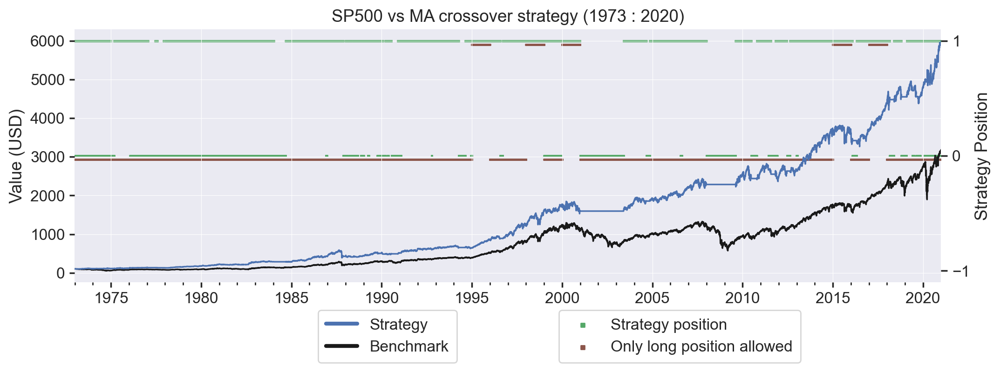

In [26]:
%run Functions.ipynb
ini_mon = 100
print("Initial invested capital = {:.2f}".format(ini_mon))

results_df_mem1 = prepare_oos_df(df_wf_mem1.loc[OOS_start[0]:OOS_end[-1]].copy(), ini_equity=ini_mon)
#results_df = prepare_oos_df(df_wf_mem1.loc['2000':].copy(), ini_equity=ini_mon)

metrics = calculate_performance_metrics(results_df_mem1, strat_name='MA Crossover with WF memory = 2')
metrics

show_oos_plot(results_df_mem1, with_legend=True)

In [27]:
params_combinations_mem1 = pd.DataFrame([fast_ma_best_list_mem1, slow_ma_best_list_mem1], index=['fast_ma', 'slow_ma'], columns=OOS_start.year)
params_combinations_mem1

,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
fast_ma,1,1,25,1,1,1,1,1,1,1,1,65,1,65,65,1,35,30,10,1,5,50,5,35,65,0,1,0,55,50,50,55,50,50,50,35,40,35,5,45,45,50,0,55,0,20,25,1
slow_ma,5,5,260,5,100,5,5,5,5,5,5,140,220,180,180,20,40,40,300,260,300,120,5,80,220,0,5,0,300,260,260,220,240,240,280,280,260,220,100,120,120,140,0,120,0,60,40,10


# Putting all together:

In [28]:
params_combinations_mem10.index = ['fast_ma_10', 'slow_ma_10']
params_combinations_mem5.index = ['fast_ma_5', 'slow_ma_5']
params_combinations_mem3.index = ['fast_ma_3', 'slow_ma_3']
params_combinations_mem2.index = ['fast_ma_2', 'slow_ma_2']
params_combinations_mem1.index = ['fast_ma_1', 'slow_ma_1']


all_params_combinations = pd.concat([params_combinations_mem10, 
                                    params_combinations_mem5, 
                                    params_combinations_mem3, 
                                    params_combinations_mem2, 
                                    params_combinations_mem1])
all_params_combinations

,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
fast_ma_10,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,65,60,55,50,50,50,45,45,50,40,40,35,50,50,50,50,40,45
slow_ma_10,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,200,260,260,260,0,0,0,0,0,0,0,0,220,220,220,240,260,260,260,260,240,260,260,300,140,140,140,140,140,120
fast_ma_5,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,35,35,35,1,5,0,0,0,0,0,0,0,45,45,50,50,50,50,25,35,35,35,35,40,45,45,45,0,0,0,25
slow_ma_5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,220,220,140,40,40,40,260,300,0,0,0,0,0,0,0,280,280,260,240,240,240,280,280,280,220,220,160,120,120,120,0,0,0,240
fast_ma_3,1,1,1,1,1,1,1,1,1,1,1,1,1,1,3,1,1,35,35,30,5,5,0,0,0,65,0,0,65,45,45,55,50,50,50,0,35,35,35,40,45,45,45,50,0,0,25,20
slow_ma_3,5,5,5,5,5,5,5,5,5,5,5,5,220,220,240,140,20,40,40,40,300,300,0,0,0,220,0,0,300,280,280,220,240,240,240,0,280,220,220,160,120,120,120,120,0,0,240,60
fast_ma_2,1,1,1,1,1,1,1,1,1,1,1,1,1,3,65,1,35,35,30,5,5,5,0,0,35,65,0,0,65,45,50,55,50,50,0,40,35,35,35,5,45,45,50,0,0,0,20,25
slow_ma_2,5,5,5,5,100,5,5,5,5,5,5,220,220,240,180,140,40,40,40,300,300,300,0,0,80,220,0,0,300,280,260,220,240,240,0,300,280,220,220,100,120,120,140,0,0,0,60,40
fast_ma_1,1,1,25,1,1,1,1,1,1,1,1,65,1,65,65,1,35,30,10,1,5,50,5,35,65,0,1,0,55,50,50,55,50,50,50,35,40,35,5,45,45,50,0,55,0,20,25,1
slow_ma_1,5,5,260,5,100,5,5,5,5,5,5,140,220,180,180,20,40,40,300,260,300,120,5,80,220,0,5,0,300,260,260,220,240,240,280,280,260,220,100,120,120,140,0,120,0,60,40,10


,mem = 10,mem = 5,mem = 3,mem = 2,mem = 1,B&H
Date,,,,,,
1973-01-02,100.878197,100.878197,100.878197,100.878197,100.878197,100.889450
1973-01-03,101.276290,101.276290,101.276290,101.276290,101.276290,101.287587
1973-01-04,101.132301,101.132301,101.132301,101.132301,101.132301,101.143582
1973-01-05,101.530394,101.530394,101.530394,101.530394,101.530394,101.541719
1973-01-08,101.513450,101.513450,101.513450,101.513450,101.513450,101.524774


<AxesSubplot:xlabel='Date'>

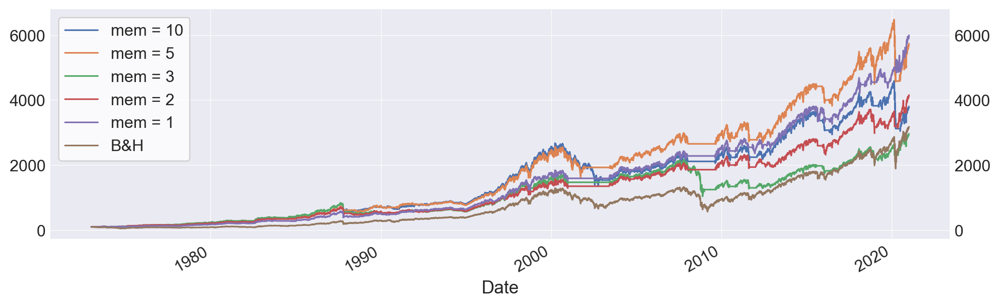

In [29]:
all_strat_cum_ret = pd.concat([results_df_mem10[['Strat_cum_ret']], 
                                results_df_mem5[['Strat_cum_ret']], 
                                results_df_mem3[['Strat_cum_ret']], 
                                results_df_mem2[['Strat_cum_ret']], 
                                results_df_mem1[['Strat_cum_ret']],
                                results_df_mem1[['Market_cum_ret']]],
                              axis = 1)
all_strat_cum_ret.columns = ['mem = 10', 'mem = 5', 'mem = 3', 'mem = 2', 'mem = 1', 'B&H']
all_strat_cum_ret.head()
all_strat_cum_ret.plot()

<AxesSubplot:xlabel='Date'>

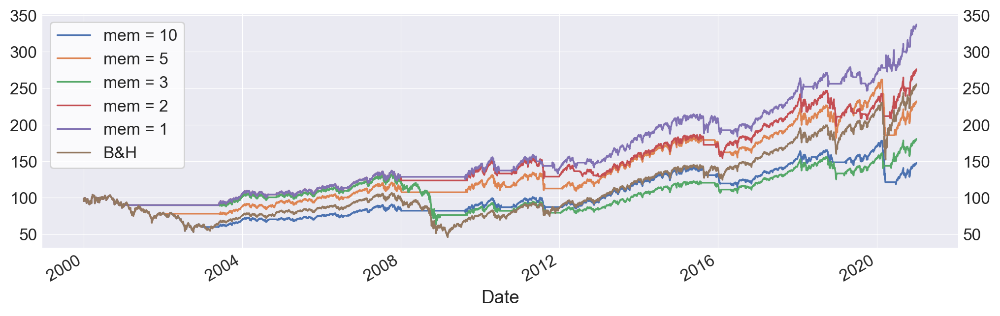

In [30]:
results_df_2000_mem10 = prepare_oos_df(df_wf_mem10.loc['2000':OOS_end[-1]].copy(), ini_equity=ini_mon)
results_df_2000_mem5 = prepare_oos_df(df_wf_mem5.loc['2000':OOS_end[-1]].copy(), ini_equity=ini_mon)
results_df_2000_mem3 = prepare_oos_df(df_wf_mem3.loc['2000':OOS_end[-1]].copy(), ini_equity=ini_mon)
results_df_2000_mem2 = prepare_oos_df(df_wf_mem2.loc['2000':OOS_end[-1]].copy(), ini_equity=ini_mon)
results_df_2000_mem1 = prepare_oos_df(df_wf_mem1.loc['2000':OOS_end[-1]].copy(), ini_equity=ini_mon)

all_strat_cum_ret_2000 = pd.concat([results_df_2000_mem10[['Strat_cum_ret']], 
                                results_df_2000_mem5[['Strat_cum_ret']], 
                                results_df_2000_mem3[['Strat_cum_ret']], 
                                results_df_2000_mem2[['Strat_cum_ret']], 
                                results_df_2000_mem1[['Strat_cum_ret']],
                                results_df_2000_mem1[['Market_cum_ret']]],
                              axis = 1)
all_strat_cum_ret_2000.columns = ['mem = 10', 'mem = 5', 'mem = 3', 'mem = 2', 'mem = 1', 'B&H']
all_strat_cum_ret_2000.plot()

In [31]:
metrics_10 = calculate_performance_metrics(results_df_mem10, strat_name='mem = 10')
metrics_5 = calculate_performance_metrics(results_df_mem5, strat_name='mem = 5')
metrics_3 = calculate_performance_metrics(results_df_mem3, strat_name='mem = 3')
metrics_2 = calculate_performance_metrics(results_df_mem2, strat_name='mem = 2')
metrics_1 = calculate_performance_metrics(results_df_mem1, strat_name='mem = 1')

all_metrics = pd.concat([metrics_10, metrics_5, metrics_3, metrics_2, metrics_1]).drop_duplicates()
all_metrics = all_metrics.loc[['mem = 1', 'mem = 2', 'mem = 3', 'mem = 5', 'mem = 10', 'Buy and Hold'], :]
all_metrics

,AbsRet,ARC,IR,aSD,MD,AMD,MLD,IR**,All Risk,ARCMD,ARCAMD,Num Trades,Out of market
mem = 1,5893.7497,8.8927,0.7199,12.3522,33.2363,8.5277,3.9890,0.1926,1.3966,0.2676,1.0428,753,3778
mem = 2,4057.8346,8.0670,0.6453,12.5005,34.5888,8.8973,7.8905,0.1505,3.0355,0.2332,0.9067,713,3639
mem = 3,2863.4169,7.3080,0.5341,13.6839,51.9254,9.6032,9.9220,0.0752,6.7702,0.1407,0.7610,815,3448
mem = 5,5635.8392,8.7930,0.6891,12.7610,36.7708,9.2189,6.0972,0.1648,2.6375,0.2391,0.9538,893,3417
mem = 10,3703.9726,7.8671,0.5929,13.2694,49.1469,9.7505,13.0021,0.0949,8.2678,0.1601,0.8068,1123,3330
Buy and Hold,3081.7619,7.4669,0.4270,17.4882,56.7754,14.6840,7.5099,0.0562,10.9493,0.1315,0.5085,1,0


In [32]:
metrics_10 = calculate_performance_metrics(results_df_mem10['2000':], strat_name='mem = 10')
metrics_5 = calculate_performance_metrics(results_df_mem5['2000':], strat_name='mem = 5')
metrics_3 = calculate_performance_metrics(results_df_mem3['2000':], strat_name='mem = 3')
metrics_2 = calculate_performance_metrics(results_df_mem2['2000':], strat_name='mem = 2')
metrics_1 = calculate_performance_metrics(results_df_mem1['2000':], strat_name='mem = 1')

all_metrics_2000 = pd.concat([metrics_10, metrics_5, metrics_3, metrics_2, metrics_1]).drop_duplicates()
all_metrics_2000 = all_metrics_2000.loc[['mem = 1', 'mem = 2', 'mem = 3', 'mem = 5', 'mem = 10', 'Buy and Hold'], :]
all_metrics_2000

,AbsRet,ARC,IR,aSD,MD,AMD,MLD,IR**,All Risk,ARCMD,ARCAMD,Num Trades,Out of market
mem = 1,237.5324,5.9732,0.5048,11.8321,17.1998,8.0540,3.7563,0.1753,0.6157,0.3473,0.7416,69,1633
mem = 2,176.1825,4.9642,0.4081,12.1656,19.7782,8.7512,3.7563,0.1024,0.7910,0.2510,0.5673,37,1521
mem = 3,80.6361,2.8602,0.1882,15.2012,51.9254,10.4619,9.9220,0.0104,8.1934,0.0551,0.2734,27,1264
mem = 5,132.2123,4.0997,0.2902,14.1273,36.7708,10.7742,6.0972,0.0324,3.4125,0.1115,0.3805,19,1124
mem = 10,47.7604,1.8794,0.1253,14.9975,49.1469,12.2677,13.0021,0.0048,11.7568,0.0382,0.1532,23,1049
Buy and Hold,155.6454,4.5781,0.2301,19.8926,56.7754,16.5198,7.1732,0.0186,13.3834,0.0806,0.2771,1,0


## Visualization

In [33]:
all_params_combinations

,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
fast_ma_10,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,65,60,55,50,50,50,45,45,50,40,40,35,50,50,50,50,40,45
slow_ma_10,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,200,260,260,260,0,0,0,0,0,0,0,0,220,220,220,240,260,260,260,260,240,260,260,300,140,140,140,140,140,120
fast_ma_5,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,35,35,35,1,5,0,0,0,0,0,0,0,45,45,50,50,50,50,25,35,35,35,35,40,45,45,45,0,0,0,25
slow_ma_5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,220,220,140,40,40,40,260,300,0,0,0,0,0,0,0,280,280,260,240,240,240,280,280,280,220,220,160,120,120,120,0,0,0,240
fast_ma_3,1,1,1,1,1,1,1,1,1,1,1,1,1,1,3,1,1,35,35,30,5,5,0,0,0,65,0,0,65,45,45,55,50,50,50,0,35,35,35,40,45,45,45,50,0,0,25,20
slow_ma_3,5,5,5,5,5,5,5,5,5,5,5,5,220,220,240,140,20,40,40,40,300,300,0,0,0,220,0,0,300,280,280,220,240,240,240,0,280,220,220,160,120,120,120,120,0,0,240,60
fast_ma_2,1,1,1,1,1,1,1,1,1,1,1,1,1,3,65,1,35,35,30,5,5,5,0,0,35,65,0,0,65,45,50,55,50,50,0,40,35,35,35,5,45,45,50,0,0,0,20,25
slow_ma_2,5,5,5,5,100,5,5,5,5,5,5,220,220,240,180,140,40,40,40,300,300,300,0,0,80,220,0,0,300,280,260,220,240,240,0,300,280,220,220,100,120,120,140,0,0,0,60,40
fast_ma_1,1,1,25,1,1,1,1,1,1,1,1,65,1,65,65,1,35,30,10,1,5,50,5,35,65,0,1,0,55,50,50,55,50,50,50,35,40,35,5,45,45,50,0,55,0,20,25,1
slow_ma_1,5,5,260,5,100,5,5,5,5,5,5,140,220,180,180,20,40,40,300,260,300,120,5,80,220,0,5,0,300,260,260,220,240,240,280,280,260,220,100,120,120,140,0,120,0,60,40,10


In [34]:
import plotly.express as px

In [35]:
fig = px.line(all_strat_cum_ret, width=1250, height=650)
#fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1),
    legend_title_text=' '
)
#fig.show()

In [36]:
fig = px.line(all_strat_cum_ret_2000, width=1250, height=650)
#fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1),
    legend_title_text=' '
)
#fig.show()

In [37]:
all_metrics
all_metrics_2000

,AbsRet,ARC,IR,aSD,MD,AMD,MLD,IR**,All Risk,ARCMD,ARCAMD,Num Trades,Out of market
mem = 1,5893.7497,8.8927,0.7199,12.3522,33.2363,8.5277,3.9890,0.1926,1.3966,0.2676,1.0428,753,3778
mem = 2,4057.8346,8.0670,0.6453,12.5005,34.5888,8.8973,7.8905,0.1505,3.0355,0.2332,0.9067,713,3639
mem = 3,2863.4169,7.3080,0.5341,13.6839,51.9254,9.6032,9.9220,0.0752,6.7702,0.1407,0.7610,815,3448
mem = 5,5635.8392,8.7930,0.6891,12.7610,36.7708,9.2189,6.0972,0.1648,2.6375,0.2391,0.9538,893,3417
mem = 10,3703.9726,7.8671,0.5929,13.2694,49.1469,9.7505,13.0021,0.0949,8.2678,0.1601,0.8068,1123,3330
Buy and Hold,3081.7619,7.4669,0.4270,17.4882,56.7754,14.6840,7.5099,0.0562,10.9493,0.1315,0.5085,1,0


,AbsRet,ARC,IR,aSD,MD,AMD,MLD,IR**,All Risk,ARCMD,ARCAMD,Num Trades,Out of market
mem = 1,237.5324,5.9732,0.5048,11.8321,17.1998,8.0540,3.7563,0.1753,0.6157,0.3473,0.7416,69,1633
mem = 2,176.1825,4.9642,0.4081,12.1656,19.7782,8.7512,3.7563,0.1024,0.7910,0.2510,0.5673,37,1521
mem = 3,80.6361,2.8602,0.1882,15.2012,51.9254,10.4619,9.9220,0.0104,8.1934,0.0551,0.2734,27,1264
mem = 5,132.2123,4.0997,0.2902,14.1273,36.7708,10.7742,6.0972,0.0324,3.4125,0.1115,0.3805,19,1124
mem = 10,47.7604,1.8794,0.1253,14.9975,49.1469,12.2677,13.0021,0.0048,11.7568,0.0382,0.1532,23,1049
Buy and Hold,155.6454,4.5781,0.2301,19.8926,56.7754,16.5198,7.1732,0.0186,13.3834,0.0806,0.2771,1,0


### Save data

In [42]:
# results_df_mem1.to_csv("Results/Position/results_df_mem1.csv", sep=";")
# results_df_mem2.to_csv("Results/Position/results_df_mem2.csv", sep=";")
# results_df_mem3.to_csv("Results/Position/results_df_mem3.csv", sep=";")
# results_df_mem5.to_csv("Results/Position/results_df_mem5.csv", sep=";")
# results_df_mem10.to_csv("Results/Position/results_df_mem10.csv", sep=";")

In [43]:
# all_metrics.to_csv("Results/all_metrics.csv", sep=";")
# all_metrics_2000.to_csv("Results/all_metrics_2000.csv", sep=";")

In [44]:
# all_strat_cum_ret.to_csv("Results/all_strat_cum_ret.csv", sep=";")
# all_strat_cum_ret_2000.to_csv("Results/all_strat_cum_ret_2000.csv", sep=";")

In [45]:
# all_params_combinations.to_csv("Results/all_params_combinations.csv", sep=";")